In [68]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as sm
import scipy.stats as stats
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cross_validation import train_test_split
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
import pandas_profiling
%matplotlib inline

In [69]:
telecom_data= pd.read_csv("telecom_churn_data.csv")

In [70]:
telecom_data.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [71]:
columns1 = ['av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_data_6','total_rech_data_7','total_rech_data_8']

In [72]:
telecom_data[columns1].head()

,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8
0,252.0,252.0,252.0,362,252,252,1.0,1.0,1.0
1,NaN,154.0,50.0,74,384,283,NaN,1.0,2.0
2,NaN,NaN,NaN,168,315,116,NaN,NaN,NaN
3,NaN,NaN,NaN,230,310,601,NaN,NaN,NaN
4,56.0,NaN,NaN,196,350,287,1.0,NaN,NaN


### Filter high-value customers

In [73]:
#replacing null
telecom_data[['total_rech_num_6','total_rech_num_7','total_rech_num_8','total_rech_num_9','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_amt_9','total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9']] = telecom_data[['total_rech_num_6','total_rech_num_7','total_rech_num_8','total_rech_num_9','total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','total_rech_amt_9','total_rech_data_6','total_rech_data_7','total_rech_data_8','total_rech_data_9','av_rech_amt_data_6','av_rech_amt_data_7','av_rech_amt_data_8','av_rech_amt_data_9']].replace(np.nan, 0, regex=True)

    We can do countofdata* avgdata = total_data
        Total_data + total_rech

In [74]:
telecom_data['total_rech_amt_data_6'] = telecom_data.apply(lambda x: (x['total_rech_data_6']*x['av_rech_amt_data_6']),axis =1)

In [75]:
telecom_data['total_rech_amt_data_7'] = telecom_data.apply(lambda x: (x['total_rech_data_7']*x['av_rech_amt_data_7']),axis =1)

In [76]:
telecom_data['avg_rech_amt_6_7'] = telecom_data.apply(lambda x: ((x['total_rech_amt_6']+x['total_rech_amt_7']+x['total_rech_amt_data_6']+x['total_rech_amt_data_7'])/2),axis =1)

In [77]:
telecom_data['avg_rech_decile'] = pd.qcut(telecom_data['avg_rech_amt_6_7'], 10, labels=False)

In [78]:
telecom_data[['mobile_number','avg_rech_decile']].head()

,mobile_number,avg_rech_decile
0,7000842753,7
1,7001865778,5
2,7001625959,4
3,7001204172,4
4,7000142493,5


In [79]:
telecom_data_high_value = telecom_data[telecom_data.avg_rech_decile >6 ]

In [80]:
telecom_data_high_value[['mobile_number','avg_rech_decile']].head()

,mobile_number,avg_rech_decile
0,7000842753,7
7,7000701601,9
8,7001524846,8
21,7002124215,7
23,7000887461,7


In [81]:
telecom_data_high_value.count().head()

mobile_number     29953
circle_id         29953
loc_og_t2o_mou    29730
std_og_t2o_mou    29730
loc_ic_t2o_mou    29730
dtype: int64

In [82]:
telecom_data_high_value.to_csv('telecom_data_high_value.csv')

In [83]:
pandas_profiling.ProfileReport(telecom_data_high_value)

Number of variables,231
Number of observations,29953
Total Missing (%),7.5%
Total size in memory,52.8 MiB
Average record size in memory,1.8 KiB
Numeric,194
Categorical,11
Boolean,11
Date,0
Text (Unique),0
Rejected,15


### Data Preprocessing

In [84]:
##Dropping single value columns

In [85]:
telecom_data_high_value['loc_ic_t2o_mou'].nunique()

1

In [86]:
telecom_data_high_value[ 'std_og_t2o_mou'].nunique()

1

In [87]:
telecom_data_high_value['loc_og_t2o_mou'].nunique()

1

In [88]:
telecom_data_high_value['circle_id'].nunique()

1

In [89]:
telecom_data_high_value.drop(['loc_ic_t2o_mou','std_og_t2o_mou','loc_og_t2o_mou','circle_id'], axis =1, inplace = True)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [90]:
### Hardcoding the month end dates

In [91]:
telecom_data_high_value['last_date_of_month_6'] = pd.to_datetime('6/30/2014', format='%m/%d/%Y')
telecom_data_high_value['last_date_of_month_7'] = pd.to_datetime('7/31/2014', format='%m/%d/%Y')
telecom_data_high_value['last_date_of_month_8'] = pd.to_datetime('8/31/2014', format='%m/%d/%Y')
telecom_data_high_value['last_date_of_month_9'] = pd.to_datetime('9/30/2014', format='%m/%d/%Y')

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pand

In [92]:
### arpu_ -- columns

In [93]:
telecom_data_high_value.filter(regex='arpu_').isnull().any()

arpu_6       False
arpu_7       False
arpu_8       False
arpu_9       False
arpu_3g_6     True
arpu_3g_7     True
arpu_3g_8     True
arpu_3g_9     True
arpu_2g_6     True
arpu_2g_7     True
arpu_2g_8     True
arpu_2g_9     True
dtype: bool

In [94]:
### exploratory analysis

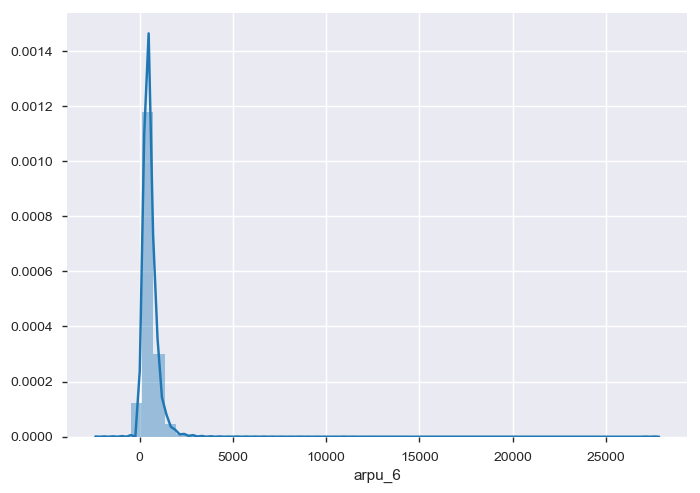

In [95]:
sns.distplot(telecom_data_high_value['arpu_6'])
plt.show()

In [ ]:
##Add 3g + 2G after missing value
#replacing null
telecom_data_high_value[['arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9','arpu_2g_6','arpu_2g_7','arpu_2g_8', 'arpu_2g_9']] = telecom_data_high_value[['arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9','arpu_2g_6','arpu_2g_7','arpu_2g_8', 'arpu_2g_9']].replace(np.nan, 0, regex=True)

In [96]:
##Add 3g + 4G after missing value
#replacing null
telecom_data_high_value[['arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9','arpu_2g_6','arpu_2g_7','arpu_2g_8', 'arpu_2g_9']] = telecom_data_high_value[['arpu_3g_6','arpu_3g_7','arpu_3g_8','arpu_3g_9','arpu_2g_6','arpu_2g_7','arpu_2g_8', 'arpu_2g_9']].replace(np.nan, 0, regex=True)

C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [97]:
telecom_data_high_value['arpu_2g_3g_6'] = telecom_data_high_value.apply(lambda x: (x['arpu_3g_6']+x['arpu_2g_6']),axis =1)
telecom_data_high_value.drop(['arpu_3g_6','arpu_2g_6'],axis=1, inplace = True)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [98]:
telecom_data_high_value['arpu_2g_3g_7'] = telecom_data_high_value.apply(lambda x: (x['arpu_3g_7']+x['arpu_2g_7']),axis =1)
telecom_data_high_value.drop(['arpu_3g_7','arpu_2g_7'],axis=1, inplace = True)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [99]:
telecom_data_high_value['arpu_2g_3g_8'] = telecom_data_high_value.apply(lambda x: (x['arpu_3g_8']+x['arpu_2g_8']),axis =1)
telecom_data_high_value.drop(['arpu_3g_8','arpu_2g_8'],axis=1, inplace = True)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [100]:
##offnet and onnet mou

In [101]:
columns_net = telecom_data_high_value.filter(regex='net_').columns

In [102]:
telecom_data_high_value[columns_net] = telecom_data_high_value[columns_net].replace(np.nan, 0, regex=True)

C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


#### Frequency

In [103]:
def churnfreq(telecom_data_high_value):
    i = 0
    a = np.where(telecom_data_high_value[['date_of_last_rech_6']].isnull(),0,1)
    i = i+a
    b = np.where(telecom_data_high_value[['date_of_last_rech_7']].isnull(),0,1)
    i=i+b
    c = np.where(telecom_data_high_value[['date_of_last_rech_8']].isnull(),0,1)
    i=i+c
    d = np.where(telecom_data_high_value[['date_of_last_rech_9']].isnull(),0,1)
    i=i+d
    return i

In [104]:
telecom_data_high_value['Frequency'] = 0
telecom_data_high_value['Frequency'] = telecom_data_high_value.apply(churnfreq, axis=1)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [105]:
telecom_data_high_value[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9','Frequency']][telecom_data_high_value.date_of_last_rech_7.isnull() == True].head()

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,Frequency
603,06-07-2014,NaN,NaN,09-05-2014,2
679,6/29/2014,NaN,8/24/2014,NaN,2
1374,6/27/2014,NaN,8/25/2014,9/29/2014,3
1555,6/21/2014,NaN,NaN,NaN,1
2777,6/17/2014,NaN,8/28/2014,NaN,2


#### Recency -

In [106]:
telecom_data_high_value['date_of_last_rech_8'].unique()

array(['08-08-2014', '8/26/2014', '8/30/2014', '8/31/2014', '8/24/2014',
       '8/28/2014', '8/23/2014', '08-02-2014', '8/27/2014', '8/21/2014',
       '8/29/2014', '8/25/2014', '8/17/2014', '8/22/2014', '8/19/2014',
       nan, '8/15/2014', '08-09-2014', '8/20/2014', '08-01-2014',
       '08-06-2014', '08-10-2014', '8/16/2014', '08-12-2014',
       '08-07-2014', '08-11-2014', '8/13/2014', '8/18/2014', '08-05-2014',
       '8/14/2014', '08-03-2014', '08-04-2014'], dtype=object)

In [107]:
telecom_data_high_value[['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9']] = telecom_data_high_value[['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9']].replace('-', '/', regex=True)

C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [108]:
telecom_data_high_value['date_of_last_rech_8'].unique()

array(['08/08/2014', '8/26/2014', '8/30/2014', '8/31/2014', '8/24/2014',
       '8/28/2014', '8/23/2014', '08/02/2014', '8/27/2014', '8/21/2014',
       '8/29/2014', '8/25/2014', '8/17/2014', '8/22/2014', '8/19/2014',
       nan, '8/15/2014', '08/09/2014', '8/20/2014', '08/01/2014',
       '08/06/2014', '08/10/2014', '8/16/2014', '08/12/2014',
       '08/07/2014', '08/11/2014', '8/13/2014', '8/18/2014', '08/05/2014',
       '8/14/2014', '08/03/2014', '08/04/2014'], dtype=object)

In [109]:
telecom_data_high_value['date_of_last_rech_6'] = pd.to_datetime(telecom_data_high_value['date_of_last_rech_6'], format='%m/%d/%Y')
telecom_data_high_value['date_of_last_rech_7'] = pd.to_datetime(telecom_data_high_value['date_of_last_rech_7'], format='%m/%d/%Y')
telecom_data_high_value['date_of_last_rech_8'] = pd.to_datetime(telecom_data_high_value['date_of_last_rech_8'], format='%m/%d/%Y')
telecom_data_high_value['date_of_last_rech_9'] = pd.to_datetime(telecom_data_high_value['date_of_last_rech_9'], format='%m/%d/%Y')

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pand

In [110]:
telecom_data_high_value['last_date_of_month_6'] = pd.to_datetime('6/30/2014', format='%m/%d/%Y')
telecom_data_high_value['last_date_of_month_7'] = pd.to_datetime('7/31/2014', format='%m/%d/%Y')
telecom_data_high_value['last_date_of_month_8'] = pd.to_datetime('8/31/2014', format='%m/%d/%Y')
telecom_data_high_value['last_date_of_month_9'] = pd.to_datetime('9/30/2014', format='%m/%d/%Y')

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pand

In [111]:
def churnrec(telecom_data_high_value):
    k=True
    a = np.where(telecom_data_high_value[['date_of_last_rech_9']].isnull(),0,1)
    b = np.where(telecom_data_high_value[['date_of_last_rech_8']].isnull(),0,1)
    c = np.where(telecom_data_high_value[['date_of_last_rech_7']].isnull(),0,1)
    d = np.where(telecom_data_high_value[['date_of_last_rech_6']].isnull(),0,1)
    while True:
        if a == 1:
            no_of_Days = (telecom_data_high_value['last_date_of_month_9']  - telecom_data_high_value['date_of_last_rech_9'])
            break
        elif b == 1:
            no_of_Days = (telecom_data_high_value['last_date_of_month_9']  - telecom_data_high_value['date_of_last_rech_8'])
            break
        elif c == 1:
            no_of_Days = (telecom_data_high_value['last_date_of_month_9']  - telecom_data_high_value['date_of_last_rech_7'])
            break
        elif d == 1:
            no_of_Days = (telecom_data_high_value['last_date_of_month_9']  - telecom_data_high_value['date_of_last_rech_6'])
            break
    return no_of_Days

In [112]:
telecom_data_high_value['Recency'] = telecom_data_high_value.apply(churnrec, axis=1)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [113]:
telecom_data_high_value[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9','Recency','Frequency']][telecom_data_high_value.date_of_last_rech_7.isnull() == True].head(20)

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,Recency,Frequency
603,2014-06-07,NaT,NaT,2014-09-05,25 days,2
679,2014-06-29,NaT,2014-08-24,NaT,37 days,2
1374,2014-06-27,NaT,2014-08-25,2014-09-29,1 days,3
1555,2014-06-21,NaT,NaT,NaT,101 days,1
2777,2014-06-17,NaT,2014-08-28,NaT,33 days,2
3757,2014-06-29,NaT,2014-08-26,2014-09-30,0 days,3
4190,2014-06-14,NaT,NaT,NaT,108 days,1
4960,2014-06-23,NaT,NaT,NaT,99 days,1
5327,2014-06-16,NaT,NaT,NaT,106 days,1
7012,2014-06-21,NaT,NaT,2014-09-13,17 days,2


#### Monetary

In [114]:
telecom_data_high_value[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_9']] = telecom_data_high_value[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_9']].replace(np.nan, 0, regex=True)

C:\Users\lenovo\Anaconda3\lib\site-packages\pandas\core\frame.py:2540: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [115]:
telecom_data_high_value['Monetary'] = telecom_data_high_value.apply(lambda x: ((x['total_rech_amt_6']+x['total_rech_amt_7']+x['total_rech_amt_8']+x['total_rech_amt_9'])/4),axis =1)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [116]:
telecom_data_high_value[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_9','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9','Recency','Frequency','Monetary']][telecom_data_high_value.date_of_last_rech_7.isnull() == True].head(20)

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,Recency,Frequency,Monetary
603,1001,0,0,1001,2014-06-07,NaT,NaT,2014-09-05,25 days,2,500.50
679,980,0,236,0,2014-06-29,NaT,2014-08-24,NaT,37 days,2,304.00
1374,1047,0,0,0,2014-06-27,NaT,2014-08-25,2014-09-29,1 days,3,261.75
1555,986,0,0,0,2014-06-21,NaT,NaT,NaT,101 days,1,246.50
2777,5021,0,5021,0,2014-06-17,NaT,2014-08-28,NaT,33 days,2,2510.50
3757,504,0,803,970,2014-06-29,NaT,2014-08-26,2014-09-30,0 days,3,569.25
4190,2555,0,0,0,2014-06-14,NaT,NaT,NaT,108 days,1,638.75
4960,1010,0,0,0,2014-06-23,NaT,NaT,NaT,99 days,1,252.50
5327,986,0,0,0,2014-06-16,NaT,NaT,NaT,106 days,1,246.50
7012,928,0,0,0,2014-06-21,NaT,NaT,2014-09-13,17 days,2,232.00


In [117]:
telecom_data_high_value['mobile_number'].isnull().any()

False

In [118]:
telecom_data_high_value['total_ic_mou_9'].isnull().any()

False

In [119]:
telecom_data_high_value['total_og_mou_9'].isnull().any()

False

In [120]:
telecom_data_high_value['vol_2g_mb_9'].isnull().any()

False

In [121]:
telecom_data_high_value['vol_3g_mb_9'].isnull().any()

False

In [122]:
def churnind(telecom_data_high_value):
    if ((telecom_data_high_value.total_ic_mou_9 == 0) & (telecom_data_high_value.total_og_mou_9 == 0) & (telecom_data_high_value.vol_2g_mb_9 == 0) & (telecom_data_high_value.vol_3g_mb_9 == 0)):
        return 1
    else:
        return 0

In [123]:
telecom_data_high_value['CHURN_IND'] = telecom_data_high_value.apply(churnind, axis=1)

C:\Users\lenovo\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [124]:
telecom_data_high_value.groupby('CHURN_IND').size()

CHURN_IND
0    27520
1     2433
dtype: int64

In [125]:
telecom_tobedel = telecom_data_high_value.filter(regex='_9')
telecom_tobedel.columns

Index(['last_date_of_month_9', 'arpu_9', 'onnet_mou_9', 'offnet_mou_9',
       'roam_ic_mou_9', 'roam_og_mou_9', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9',
       'loc_og_mou_9', 'std_og_t2t_mou_9', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_9', 'std_og_t2c_mou_9', 'std_og_mou_9', 'isd_og_mou_9',
       'spl_og_mou_9', 'og_others_9', 'total_og_mou_9', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_9', 'loc_ic_mou_9',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9',
       'std_ic_t2o_mou_9', 'std_ic_mou_9', 'total_ic_mou_9', 'spl_ic_mou_9',
       'isd_ic_mou_9', 'ic_others_9', 'total_rech_num_9', 'total_rech_amt_9',
       'max_rech_amt_9', 'date_of_last_rech_9', 'last_day_rch_amt_9',
       'date_of_last_rech_data_9', 'total_rech_data_9', 'max_rech_data_9',
       'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9',
       'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9',
       'night_pck_user

In [126]:
telecom_data_new  = telecom_data_high_value.drop(telecom_tobedel.columns, axis=1)

In [127]:
telecom_data_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29953 entries, 0 to 99997
Columns: 173 entries, mobile_number to CHURN_IND
dtypes: datetime64[ns](6), float64(134), int32(1), int64(28), object(3), timedelta64[ns](1)
memory usage: 39.6+ MB


mobile_number -- high cardinality
circle_id, last_date_of_month_6, last_date_of_month_7, last_date_of_month_8 - same value



In [128]:
telecom_data_new['CHURN_IND'].unique()

array([1, 0], dtype=int64)

In [ ]:
# plotting default rates across grade of the loan
sns.barplot(x='arpu_6', y='CHURN_IND', data=telecom_data_new)
plt.show()

In [62]:
cols_arpu = telecom_data_new.filter(regex='arpu_').columns

In [130]:
#Updating the list
cols_arpu = []

for variable in telecom_data_new.filter(regex='arpu_').columns:
    cols_arpu.append(variable)

In [131]:
cols_arpu

['arpu_6', 'arpu_7', 'arpu_8', 'arpu_2g_3g_6', 'arpu_2g_3g_7', 'arpu_2g_3g_8']

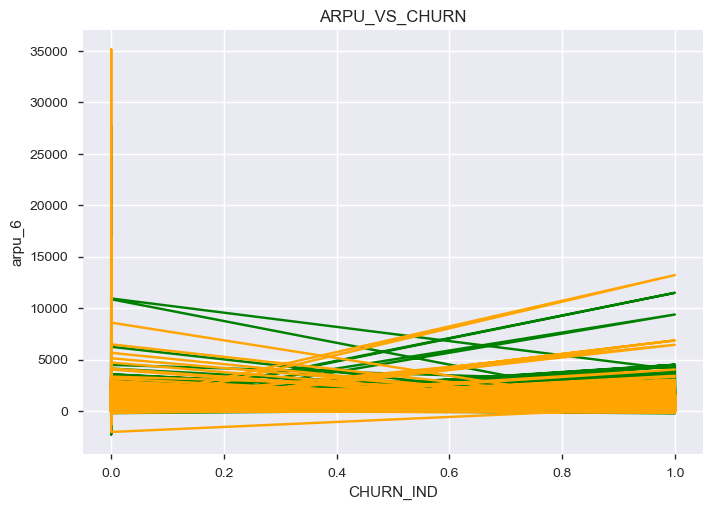

In [134]:
year = telecom_data_new['CHURN_IND']
pop_pakistan = telecom_data_new['arpu_6']
pop_india = telecom_data_new['arpu_7']

plt.plot(year, pop_pakistan, color='g')
plt.plot(year, pop_india, color='orange')
plt.xlabel('CHURN_IND')
plt.ylabel('arpu_6')
plt.title('ARPU_VS_CHURN')
plt.show()

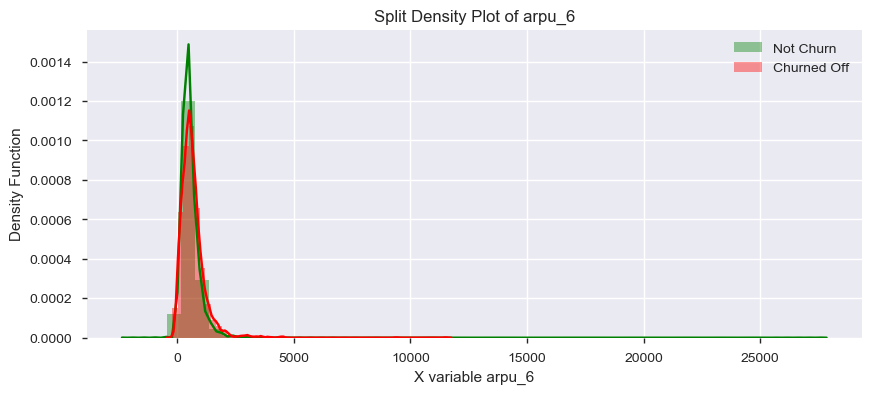

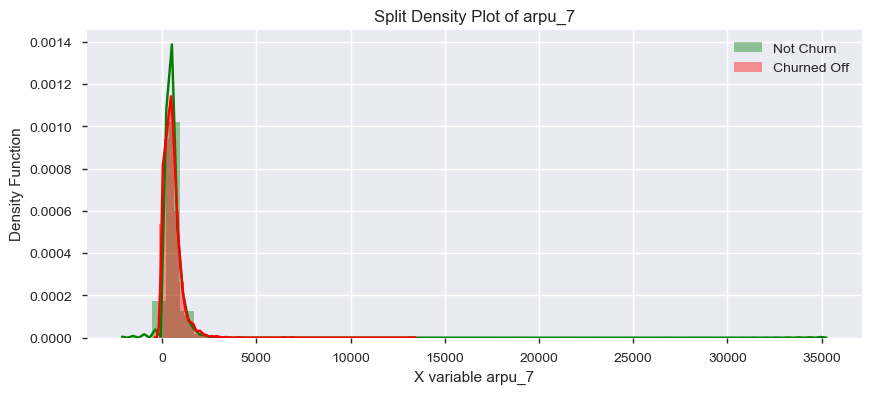

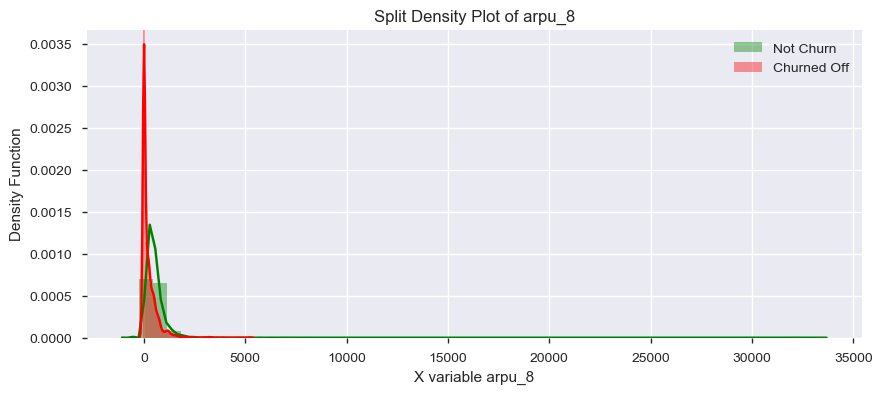

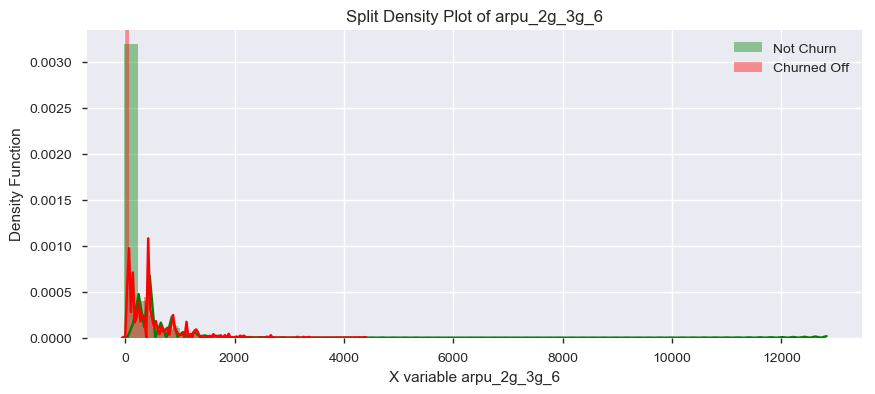

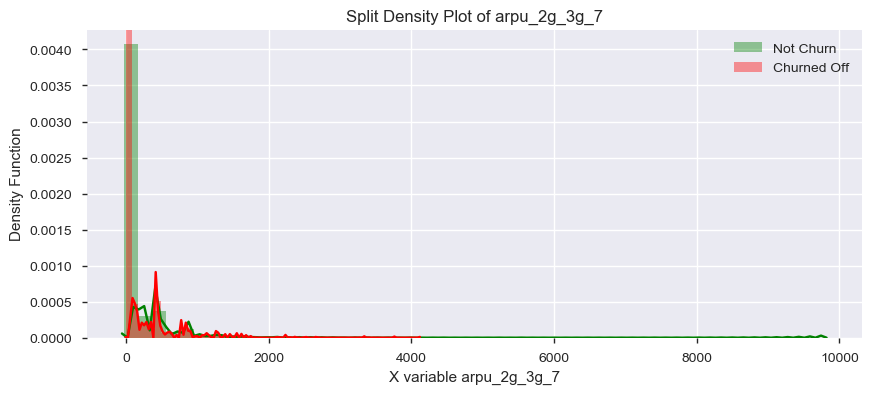

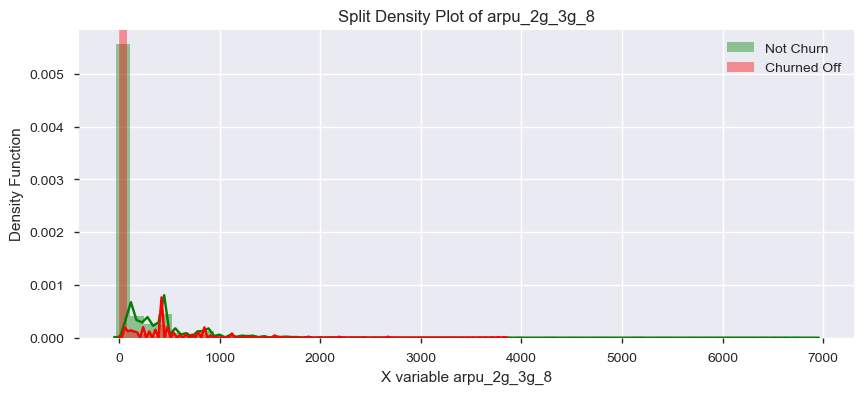

In [132]:
bp = PdfPages('Density Plots Bivariate analysis.pdf')

for num_variable in cols_arpu:
    fig,axes = plt.subplots(figsize=(10,4))
    sns.distplot(telecom_data_new[telecom_data_new['CHURN_IND']==0][num_variable], label='Not Churn', color='g', hist=True, norm_hist=False)
    sns.distplot(telecom_data_new[telecom_data_new['CHURN_IND']==1][num_variable], label='Churned Off', color='r', hist=True, norm_hist=False)
    plt.xlabel(str("X variable ") + str(num_variable) )
    plt.ylabel('Density Function')
    plt.title(str('Split Density Plot of ')+str(num_variable))
    plt.legend()
    bp.savefig(fig)

bp.close()

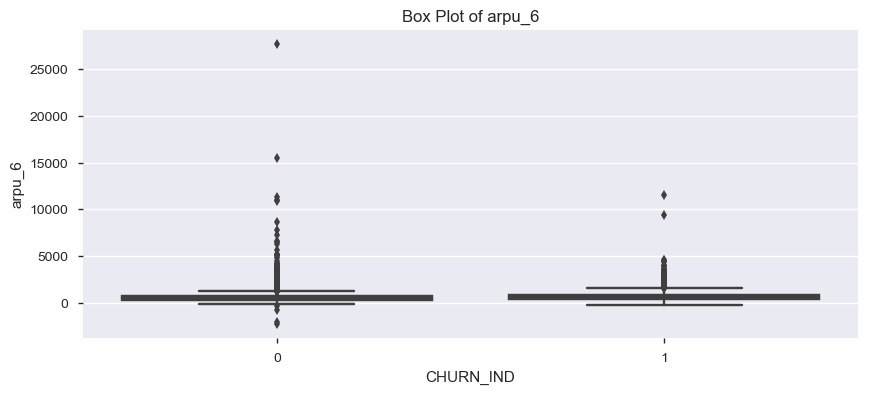

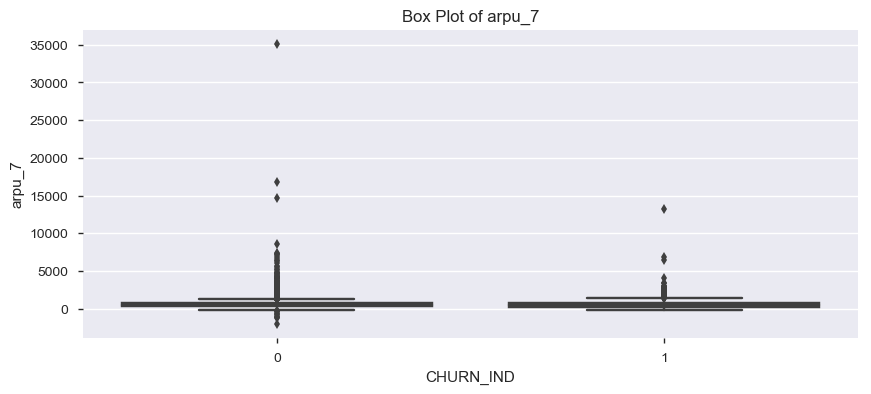

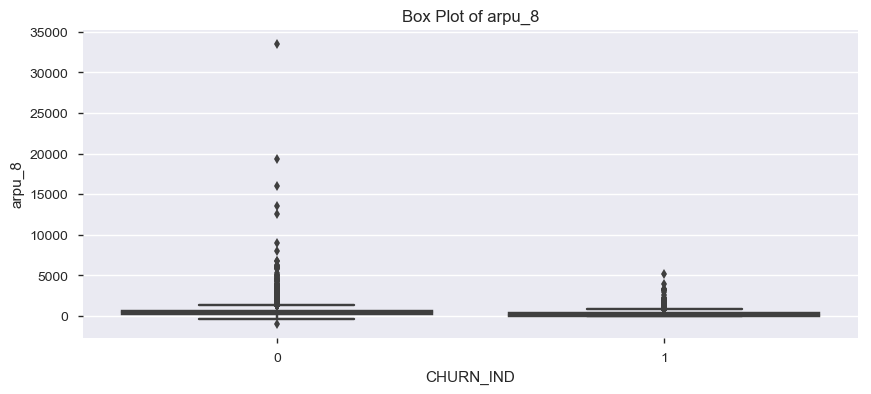

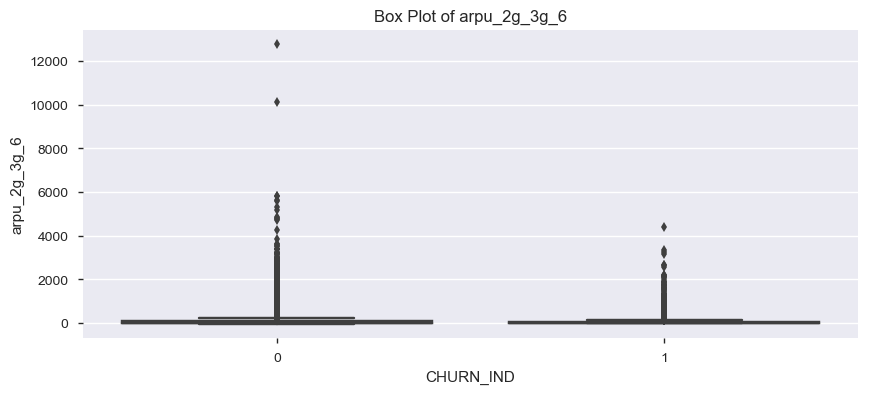

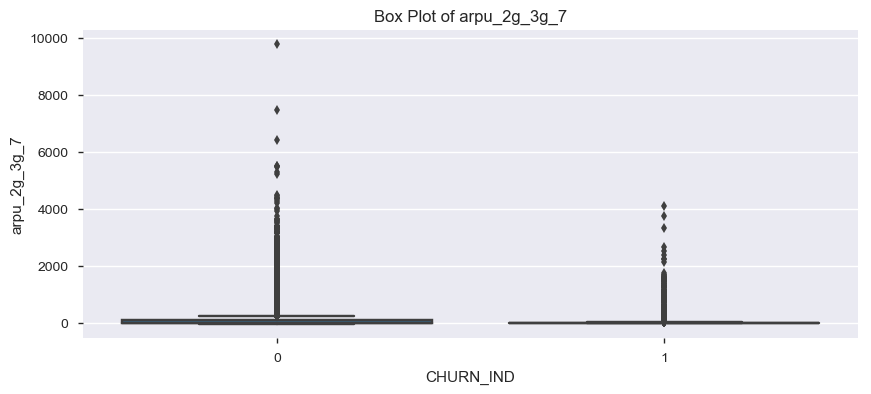

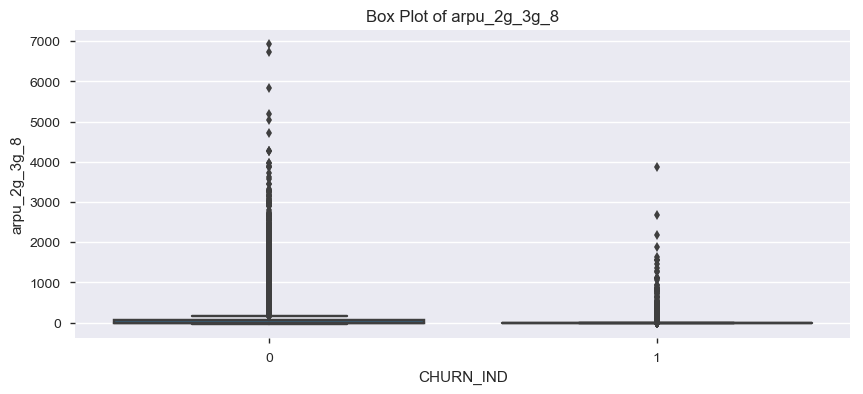

In [133]:
bp = PdfPages('BoxPlots Bivariate analysis.pdf')

for num_variable in cols_arpu:
    fig,axes = plt.subplots(figsize=(10,4))
    sns.boxplot(x='CHURN_IND', y=num_variable, data = telecom_data_new)
    plt.title(str('Box Plot of ') + str(num_variable))
    bp.savefig(fig)
bp.close()

In [73]:
date_cols = telecom_data_new.filter(regex='date').columns

In [74]:
telecom_data_new.drop(date_cols, axis =1 , inplace = True)

In [90]:
telecom_data_new.drop(['avg_rech_decile'], axis = 1 , inplace = True)

In [91]:
pandas_profiling.ProfileReport(telecom_data_new)

Number of variables,167
Number of observations,27903
Total Missing (%),10.0%
Total size in memory,35.4 MiB
Average record size in memory,1.3 KiB
Numeric,140
Categorical,1
Boolean,10
Date,0
Text (Unique),0
Rejected,16


In [76]:
telecom_data_new.filter(regex='loc_og').columns

Index(['loc_og_t2o_mou', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8'],
      dtype='object')

In [77]:
telecom_data_new.filter(regex='loc_ic').columns

Index(['loc_ic_t2o_mou', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8'],
      dtype='object')

In [78]:
telecom_data_new.filter(regex='std_og').columns

Index(['std_og_t2o_mou', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7',
       'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7',
       'std_og_t2f_mou_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7',
       'std_og_t2c_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8'],
      dtype='object')

In [79]:
telecom_data_new.filter(regex='std_ic').columns

Index(['std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8',
       'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8',
       'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8',
       'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8',
       'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8'],
      dtype='object')